<a href="https://colab.research.google.com/github/SANDESHAHAHA/Data_Science/blob/main/Datacleainingandimputing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import missingno as mp
from sklearn.preprocessing import RobustScaler


In [ ]:
df=pd.read_csv('/content/titanic_data.csv')

In [ ]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,$7.25,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,$71.28,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,$7.93,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,$53.10,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,$8.05,S


In [ ]:
df.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,$13.00,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,$30.00,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,$23.45,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,$30.00,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,$7.75,Q


In [ ]:
df.isnull()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
886,False,False,False,False,False,False,False,False,False,False,False
887,False,False,False,False,False,False,False,False,False,False,False
888,False,False,False,False,False,True,False,False,False,False,False
889,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
Age,177
SibSp,0
Parch,0
Ticket,0
Fare,6


In [ ]:
df.shape


(891, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         885 non-null    object 
 10  Embarked     889 non-null    object 
dtypes: float64(1), int64(5), object(5)
memory usage: 76.7+ KB


In [ ]:
df.describe()


,PassengerId,Survived,Pclass,Age,SibSp,Parch
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000


<Axes: >

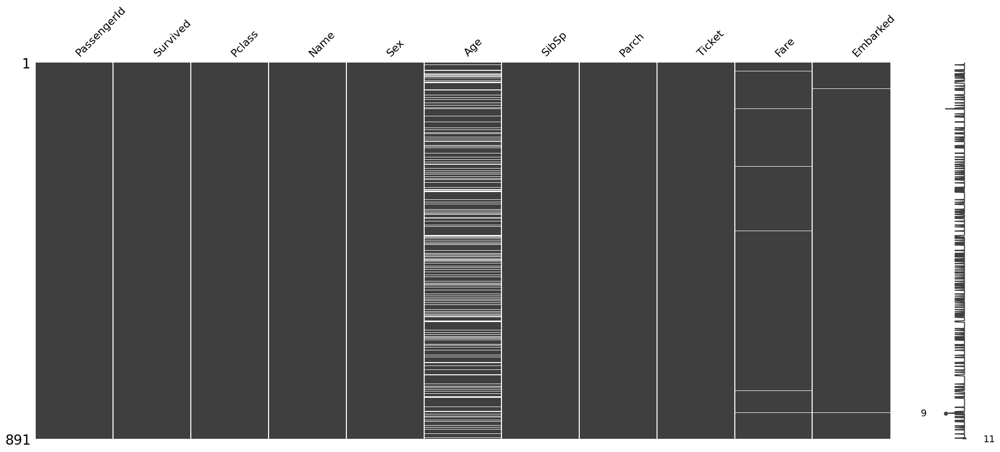

In [ ]:
mp.matrix(df)

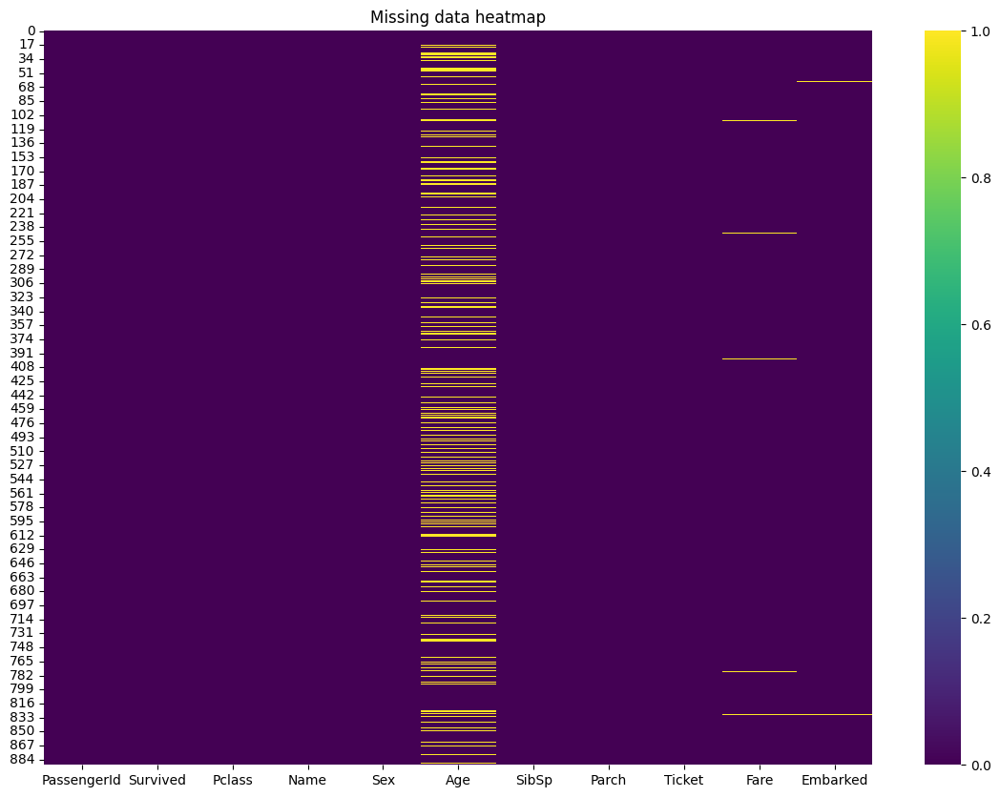

In [ ]:
plt.figure(figsize=(14,10))
sns.heatmap(df.isnull(),cmap='viridis')
plt.title("Missing data heatmap")
plt.show()

In [ ]:
titanic=df.drop('Age',axis=1)
#new copy of data frame banara remove garxa tara original jasta ko testai hunxa
#axis =0 for row and axis =1 for column
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,1,0,A/5 21171,$7.25,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,1,0,PC 17599,$71.28,C
2,3,1,3,"Heikkinen, Miss. Laina",female,0,0,STON/O2. 3101282,$7.93,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,1,0,113803,$53.10,S
4,5,0,3,"Allen, Mr. William Henry",male,0,0,373450,$8.05,S


In [ ]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,$7.25,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,$71.28,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,$7.93,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,$53.10,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,$8.05,S
...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,$13.00,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,$30.00,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,$23.45,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,$30.00,C


In [ ]:
#Removing multiple columns/rows from dataframe (change in copy only)
t=df.drop(['Age','Embarked'],axis=1)
t.head()

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Ticket,Fare
0,1,0,3,"Braund, Mr. Owen Harris",male,1,0,A/5 21171,$7.25
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,1,0,PC 17599,$71.28
2,3,1,3,"Heikkinen, Miss. Laina",female,0,0,STON/O2. 3101282,$7.93
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,1,0,113803,$53.10
4,5,0,3,"Allen, Mr. William Henry",male,0,0,373450,$8.05


In [ ]:
#implace removes the Age column from the original dataframe
df.drop('Age', axis =1, inplace=True)
df.head()

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,1,0,A/5 21171,$7.25,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,1,0,PC 17599,$71.28,C
2,3,1,3,"Heikkinen, Miss. Laina",female,0,0,STON/O2. 3101282,$7.93,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,1,0,113803,$53.10,S
4,5,0,3,"Allen, Mr. William Henry",male,0,0,373450,$8.05,S


In [ ]:
df

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,1,0,A/5 21171,$7.25,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,1,0,PC 17599,$71.28,C
2,3,1,3,"Heikkinen, Miss. Laina",female,0,0,STON/O2. 3101282,$7.93,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,1,0,113803,$53.10,S
4,5,0,3,"Allen, Mr. William Henry",male,0,0,373450,$8.05,S
...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,0,0,211536,$13.00,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,0,0,112053,$30.00,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,1,2,W./C. 6607,$23.45,S
889,890,1,1,"Behr, Mr. Karl Howell",male,0,0,111369,$30.00,C


In [ ]:
df.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
SibSp,0
Parch,0
Ticket,0
Fare,6
Embarked,2


In [ ]:
#Removing rows of missed data from the dataframe
 # given code removes the row from the dataframe where dataframe is missing
 #df_cleaned=df.dropna()
df_cleaned=df.dropna(subset=['Embarked'])
df_cleaned.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
SibSp,0
Parch,0
Ticket,0
Fare,5
Embarked,0


In [ ]:
df.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
SibSp,0
Parch,0
Ticket,0
Fare,6
Embarked,2


In [ ]:
df.dropna(subset=['Embarked'],inplace=True)
df.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
SibSp,0
Parch,0
Ticket,0
Fare,5
Embarked,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 889 entries, 0 to 890
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   PassengerId  889 non-null    int64 
 1   Survived     889 non-null    int64 
 2   Pclass       889 non-null    int64 
 3   Name         889 non-null    object
 4   Sex          889 non-null    object
 5   SibSp        889 non-null    int64 
 6   Parch        889 non-null    int64 
 7   Ticket       889 non-null    object
 8   Fare         884 non-null    object
 9   Embarked     889 non-null    object
dtypes: int64(5), object(5)
memory usage: 76.4+ KB


In [ ]:
#convert object to float for imputation of data
#removing symbol $  and convert fare column to nuemric
df['Fare']=df['Fare'].replace({'\$':''},regex=True)
df['Fare']=df['Fare'].astype(float)
df.isnull().sum()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 889 entries, 0 to 890
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  889 non-null    int64  
 1   Survived     889 non-null    int64  
 2   Pclass       889 non-null    int64  
 3   Name         889 non-null    object 
 4   Sex          889 non-null    object 
 5   SibSp        889 non-null    int64  
 6   Parch        889 non-null    int64  
 7   Ticket       889 non-null    object 
 8   Fare         884 non-null    float64
 9   Embarked     889 non-null    object 
dtypes: float64(1), int64(5), object(4)
memory usage: 76.4+ KB


In [ ]:
df['Fare']=df['Fare'].fillna(df['Fare'].median())
df.isnull().sum()

,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
SibSp,0
Parch,0
Ticket,0
Fare,0
Embarked,0


<Axes: >

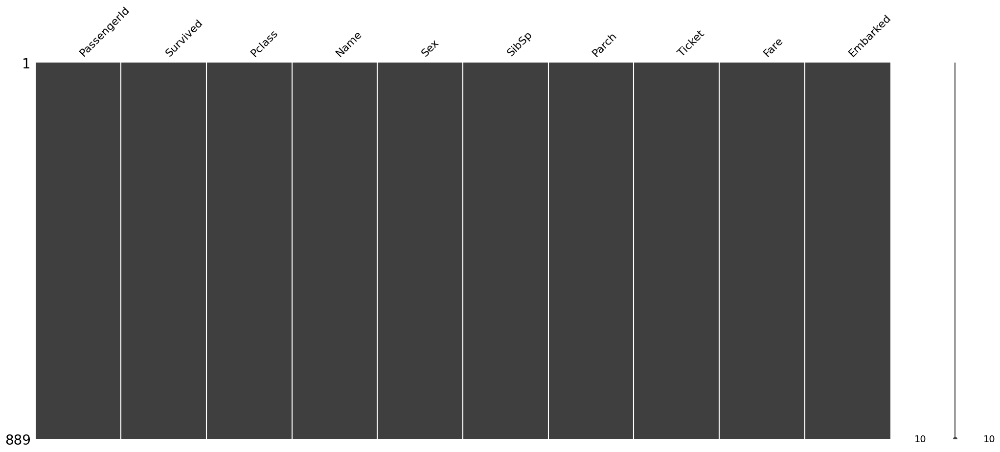

In [ ]:
mp.matrix(df)

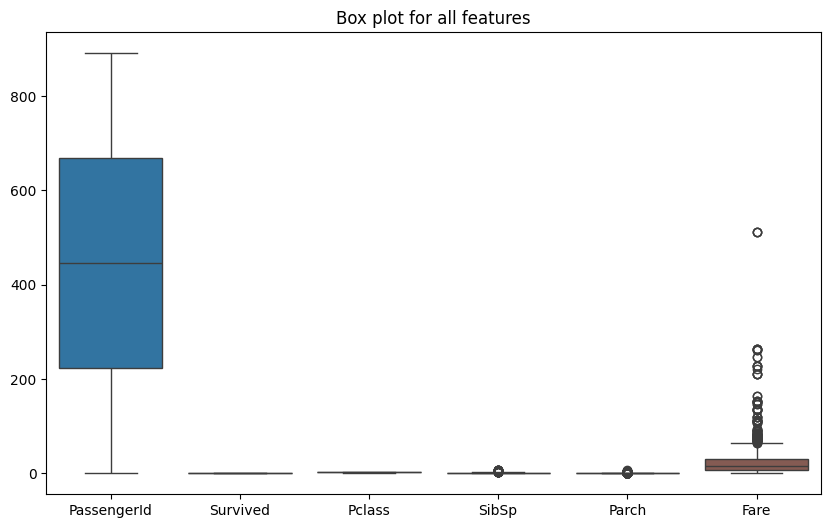

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(df)
plt.title("Box plot for all features")
plt.show()

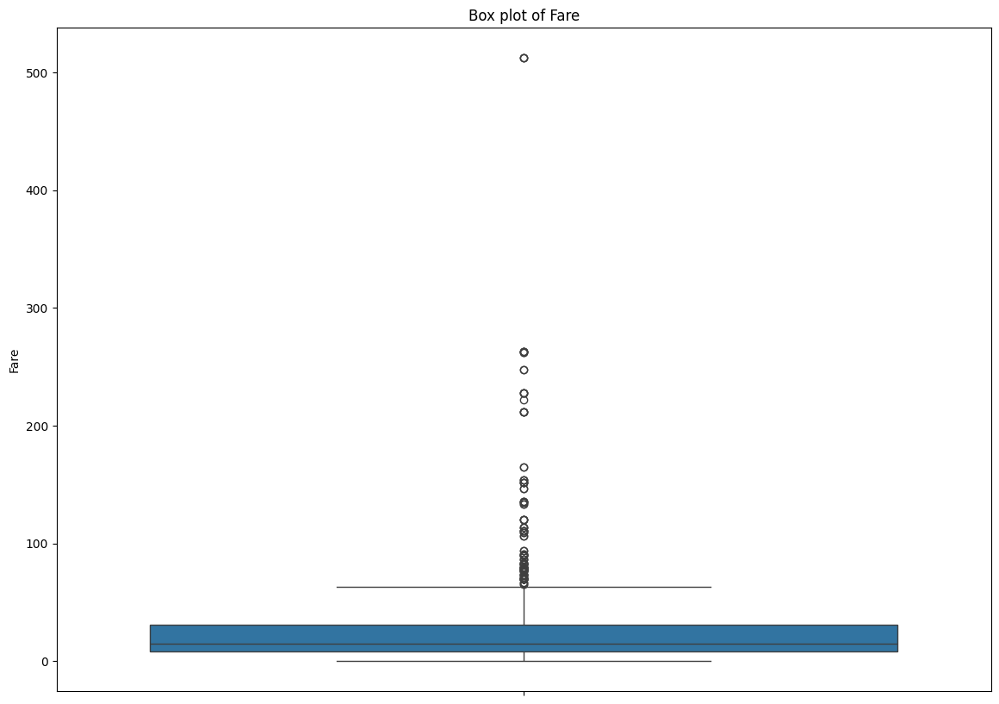

In [ ]:
plt.figure(figsize=(14,10))
sns.boxplot(df['Fare'])
plt.title("Box plot of Fare")
plt.show()

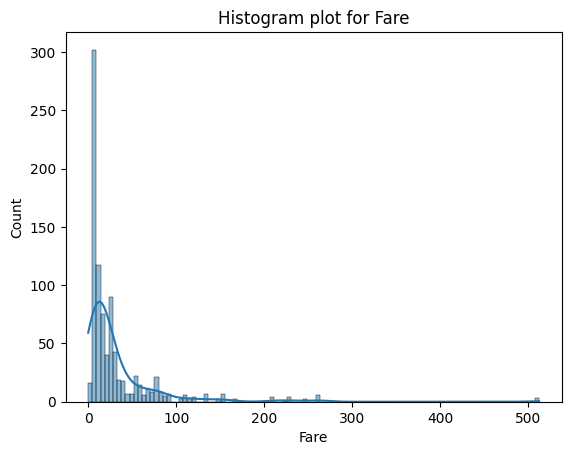

In [ ]:
sns.histplot(df['Fare'],kde=True)
plt.title("Histogram plot for Fare")
plt.show()

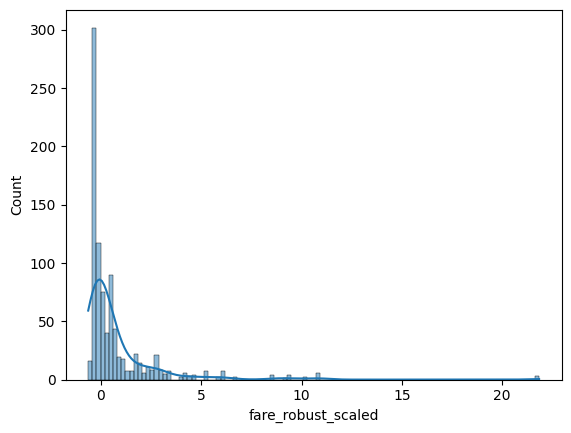

In [ ]:
scaler=RobustScaler()
df['fare_robust_scaled']=scaler.fit_transform(df[['Fare']])
sns.histplot(df['fare_robust_scaled'],kde=True)
plt.show()

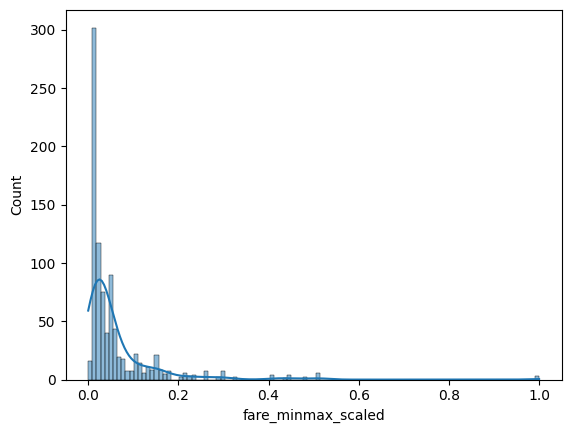

In [ ]:
from sklearn.preprocessing import MinMaxScaler
df['fare_minmax_scaled']=MinMaxScaler().fit_transform(df[['Fare']])
sns.histplot(df['fare_minmax_scaled'],kde=True)
plt.show()

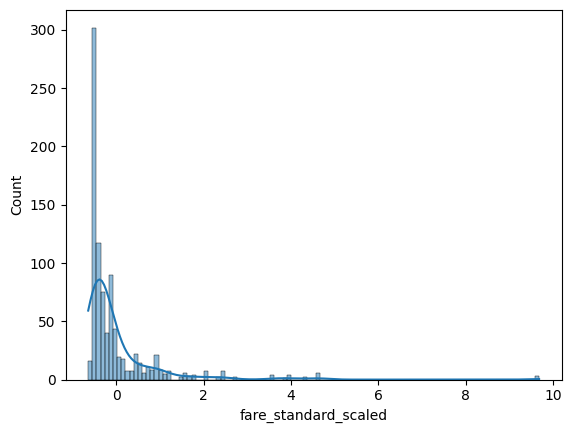

In [ ]:
from sklearn.preprocessing import StandardScaler
df['fare_standard_scaled']=StandardScaler().fit_transform(df[['Fare']])
sns.histplot(df['fare_standard_scaled'],kde=True)
plt.show()

In [ ]:
df

,PassengerId,Survived,Pclass,Name,Sex,SibSp,Parch,Ticket,Fare,Embarked,fare_robust_scaled,fare_minmax_scaled,fare_standard_scaled
0,1,0,3,"Braund, Mr. Owen Harris",male,1,0,A/5 21171,7.25,S,-0.315789,0.014151,-0.498512
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,1,0,PC 17599,71.28,C,2.492544,0.139129,0.791420
2,3,1,3,"Heikkinen, Miss. Laina",female,0,0,STON/O2. 3101282,7.93,S,-0.285965,0.015478,-0.484813
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,1,0,113803,53.10,S,1.695175,0.103644,0.425171
4,5,0,3,"Allen, Mr. William Henry",male,0,0,373450,8.05,S,-0.280702,0.015713,-0.482395
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,0,0,211536,13.00,S,-0.063596,0.025374,-0.382674
887,888,1,1,"Graham, Miss. Margaret Edith",female,0,0,112053,30.00,S,0.682018,0.058556,-0.040196
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,1,2,W./C. 6607,23.45,S,0.394737,0.045771,-0.172151
889,890,1,1,"Behr, Mr. Karl Howell",male,0,0,111369,30.00,C,0.682018,0.058556,-0.040196


In [ ]:
df['fare_standard_scaled'].mean()

-7.992606701463445e-18

In [ ]:
df['fare_standard_scaled'].std()

1.000562904632251

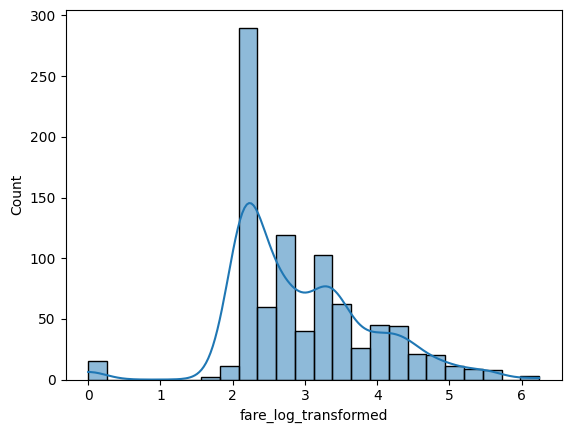

In [ ]:
#log1p=log(x+1)
df['fare_log_transformed']=np.log1p(df['Fare'])
sns.histplot(df['fare_log_transformed'],kde=True)
plt.show()

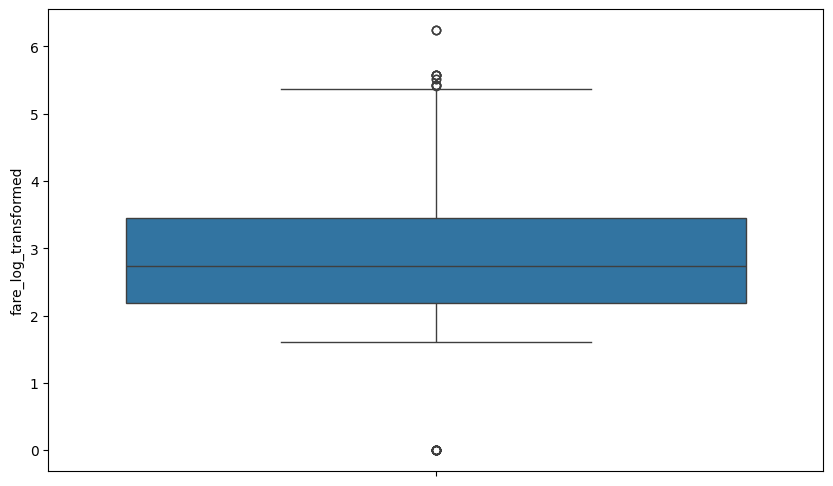

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(df['fare_log_transformed'])
plt.show()

In [ ]:
!pip install ydata_profiling
from ydata_profiling import ProfileReport

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 74.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=8d3ceed71a098cfe91178037d2e7d5cd04ef111bd78cdab44b5a9cd19e2f9458
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0


In [ ]:
report=ProfileReport(df)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#Removing duplicates  if two row has same  items in row
